# Bikes & Cycling Accessories Organisation's Transactions Data Based Cohort Analysis

## Importing Libraries

In [66]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
import warnings
warnings.filterwarnings('ignore')
import altair as alt

## Data loading and cleaning

### Data loading and view

In [2]:
# Loading dataset
transaction_df = pd.read_excel('KPMG_VI_New_raw_data_update_final.xlsx','Transactions')
demographic_df = pd.read_excel('KPMG_VI_New_raw_data_update_final.xlsx','CustomerDemographic')
address_df = pd.read_excel('KPMG_VI_New_raw_data_update_final.xlsx','CustomerAddress')

In [3]:
# View data
transaction_df.head()

,Note: The data and information in this document is reflective of a hypothetical situation and client. This document is to be used for KPMG Virtual Internship purposes only.,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12
0,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
1,1,2,2950,2017-02-25 00:00:00,False,Approved,Solex,Standard,medium,medium,71.49,53.62,41245
2,2,3,3120,2017-05-21 00:00:00,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701
3,3,37,402,2017-10-16 00:00:00,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361
4,4,88,3135,2017-08-31 00:00:00,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.1,36145


In [4]:
transaction_df.columns = transaction_df.iloc[0]
transaction_df

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
0,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
1,1,2,2950,2017-02-25 00:00:00,False,Approved,Solex,Standard,medium,medium,71.49,53.62,41245
2,2,3,3120,2017-05-21 00:00:00,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701
3,3,37,402,2017-10-16 00:00:00,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361
4,4,88,3135,2017-08-31 00:00:00,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.1,36145
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19996,19996,51,1018,2017-06-24 00:00:00,True,Approved,OHM Cycles,Standard,high,medium,2005.66,1203.4,37823
19997,19997,41,127,2017-11-09 00:00:00,True,Approved,Solex,Road,medium,medium,416.98,312.74,35560
19998,19998,87,2284,2017-04-14 00:00:00,True,Approved,OHM Cycles,Standard,medium,medium,1636.9,44.71,40410
19999,19999,6,2764,2017-07-03 00:00:00,False,Approved,OHM Cycles,Standard,high,medium,227.88,136.73,38216


In [5]:
#也可以drop
#transaction_df.drop(index=transaction_df.index[0], axis=0, inplace=True)
transaction_df = transaction_df.iloc[1:]
transaction_df

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
1,1,2,2950,2017-02-25 00:00:00,False,Approved,Solex,Standard,medium,medium,71.49,53.62,41245
2,2,3,3120,2017-05-21 00:00:00,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701
3,3,37,402,2017-10-16 00:00:00,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361
4,4,88,3135,2017-08-31 00:00:00,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.1,36145
5,5,78,787,2017-10-01 00:00:00,True,Approved,Giant Bicycles,Standard,medium,large,1765.3,709.48,42226
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19996,19996,51,1018,2017-06-24 00:00:00,True,Approved,OHM Cycles,Standard,high,medium,2005.66,1203.4,37823
19997,19997,41,127,2017-11-09 00:00:00,True,Approved,Solex,Road,medium,medium,416.98,312.74,35560
19998,19998,87,2284,2017-04-14 00:00:00,True,Approved,OHM Cycles,Standard,medium,medium,1636.9,44.71,40410
19999,19999,6,2764,2017-07-03 00:00:00,False,Approved,OHM Cycles,Standard,high,medium,227.88,136.73,38216


In [6]:
transaction_df.describe()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
count,20000,20000,20000,20000,19640,20000,19803,19803,19803,19803,20000.00,19803.00,19803
unique,20000,101,3494,364,2,2,6,4,3,3,296.00,103.00,100
top,1,0,2183,2017-02-14 00:00:00,True,Approved,Solex,Standard,medium,medium,2091.47,388.92,33879
freq,1,1378,14,82,9829,19821,4253,14176,13826,12990,465.00,465.00,234


### Data Cleaning - Checking and working with missing value

In [7]:
print(transaction_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 1 to 20000
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   transaction_id           20000 non-null  object
 1   product_id               20000 non-null  object
 2   customer_id              20000 non-null  object
 3   transaction_date         20000 non-null  object
 4   online_order             19640 non-null  object
 5   order_status             20000 non-null  object
 6   brand                    19803 non-null  object
 7   product_line             19803 non-null  object
 8   product_class            19803 non-null  object
 9   product_size             19803 non-null  object
 10  list_price               20000 non-null  object
 11  standard_cost            19803 non-null  object
 12  product_first_sold_date  19803 non-null  object
dtypes: object(13)
memory usage: 2.0+ MB
None


### *numerical variables*

In [8]:
# 都是对一整个df做动作
# Inspect missing values in the dataset
print(transaction_df.isnull().values.sum())

# Replace the ' 's with NaN
transaction_df = transaction_df.replace(" ",np.NaN)

# Impute the missing values with mean imputation
transaction_df = transaction_df.fillna(transaction_df.mean())

# Count the number of NaNs in the dataset to verify
print(transaction_df.isnull().values.sum())

1542
788


In [9]:
print(transaction_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 1 to 20000
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   transaction_id           20000 non-null  int64  
 1   product_id               20000 non-null  int64  
 2   customer_id              20000 non-null  int64  
 3   transaction_date         20000 non-null  object 
 4   online_order             20000 non-null  object 
 5   order_status             20000 non-null  object 
 6   brand                    19803 non-null  object 
 7   product_line             19803 non-null  object 
 8   product_class            19803 non-null  object 
 9   product_size             19803 non-null  object 
 10  list_price               20000 non-null  float64
 11  standard_cost            20000 non-null  float64
 12  product_first_sold_date  20000 non-null  float64
dtypes: float64(3), int64(3), object(7)
memory usage: 2.0+ MB
None


In [10]:
 # group by -> count
transaction_df['product_line'].value_counts()

Standard    14176
Road         3970
Touring      1234
Mountain      423
Name: product_line, dtype: int64

In [11]:
print(transaction_df.info())

for col in transaction_df.columns:
    # Check if the column is of object type
    if transaction_df[col].dtypes == 'object':
        # Impute with the most frequent value
        transaction_df[col] = transaction_df[col].fillna(transaction_df[col].value_counts().index[0])

# Count the number of NaNs in the dataset and print the counts to verify
print(transaction_df.isnull().values.sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 1 to 20000
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   transaction_id           20000 non-null  int64  
 1   product_id               20000 non-null  int64  
 2   customer_id              20000 non-null  int64  
 3   transaction_date         20000 non-null  object 
 4   online_order             20000 non-null  object 
 5   order_status             20000 non-null  object 
 6   brand                    19803 non-null  object 
 7   product_line             19803 non-null  object 
 8   product_class            19803 non-null  object 
 9   product_size             19803 non-null  object 
 10  list_price               20000 non-null  float64
 11  standard_cost            20000 non-null  float64
 12  product_first_sold_date  20000 non-null  float64
dtypes: float64(3), int64(3), object(7)
memory usage: 2.0+ MB
None
0


## Assigned the cohorts and calculated the monthly offset

In [12]:
dt.datetime(transaction_df['transaction_date'][1].year, transaction_df['transaction_date'][1].month, 1)

datetime.datetime(2017, 2, 1, 0, 0)

In [13]:
# A function that will parse the date Time based cohort:  1 day of month
def get_month(x):
  return dt.datetime(x.year, x.month, 1)

# Create transaction_date column based on month and store in TransactionMonth
transaction_df['TransactionMonth'] = transaction_df['transaction_date'].apply(get_month)
transaction_df

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,TransactionMonth
1,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0,2017-02-01
2,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0,2017-05-01
3,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0,2017-10-01
4,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0,2017-08-01
5,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0,2017-10-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19996,19996,51,1018,2017-06-24,True,Approved,OHM Cycles,Standard,high,medium,2005.66,1203.40,37823.0,2017-06-01
19997,19997,41,127,2017-11-09,True,Approved,Solex,Road,medium,medium,416.98,312.74,35560.0,2017-11-01
19998,19998,87,2284,2017-04-14,True,Approved,OHM Cycles,Standard,medium,medium,1636.90,44.71,40410.0,2017-04-01
19999,19999,6,2764,2017-07-03,False,Approved,OHM Cycles,Standard,high,medium,227.88,136.73,38216.0,2017-07-01


In [14]:
transaction_df.groupby('customer_id')['TransactionMonth'].transform('min')

1       2017-02-01
2       2017-01-01
3       2017-01-01
4       2017-02-01
5       2017-01-01
           ...    
19996   2017-01-01
19997   2017-01-01
19998   2017-04-01
19999   2017-02-01
20000   2017-03-01
Name: TransactionMonth, Length: 20000, dtype: datetime64[ns]

In [15]:
# Grouping by customer_id and select the InvoiceMonth value
grouping = transaction_df.groupby('customer_id')['TransactionMonth']
# Assigning a minimum InvoiceMonth value to the dataset
transaction_df['CohortMonth'] = grouping.transform('min')
# printing top 5 rows
print(transaction_df.head())

0  transaction_id  product_id  customer_id transaction_date online_order  \
1               1           2         2950       2017-02-25        False   
2               2           3         3120       2017-05-21         True   
3               3          37          402       2017-10-16        False   
4               4          88         3135       2017-08-31        False   
5               5          78          787       2017-10-01         True   

0 order_status           brand product_line product_class product_size  \
1     Approved           Solex     Standard        medium       medium   
2     Approved   Trek Bicycles     Standard        medium        large   
3     Approved      OHM Cycles     Standard           low       medium   
4     Approved  Norco Bicycles     Standard        medium       medium   
5     Approved  Giant Bicycles     Standard        medium        large   

0  list_price  standard_cost  product_first_sold_date TransactionMonth  \
1       71.49          5

In [16]:
transaction_df

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,TransactionMonth,CohortMonth
1,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0,2017-02-01,2017-02-01
2,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0,2017-05-01,2017-01-01
3,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0,2017-10-01,2017-01-01
4,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0,2017-08-01,2017-02-01
5,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0,2017-10-01,2017-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19996,19996,51,1018,2017-06-24,True,Approved,OHM Cycles,Standard,high,medium,2005.66,1203.40,37823.0,2017-06-01,2017-01-01
19997,19997,41,127,2017-11-09,True,Approved,Solex,Road,medium,medium,416.98,312.74,35560.0,2017-11-01,2017-01-01
19998,19998,87,2284,2017-04-14,True,Approved,OHM Cycles,Standard,medium,medium,1636.90,44.71,40410.0,2017-04-01,2017-04-01
19999,19999,6,2764,2017-07-03,False,Approved,OHM Cycles,Standard,high,medium,227.88,136.73,38216.0,2017-07-01,2017-02-01


## Demographic data prep

In [17]:
# view demographic data
demographic_df.nunique()

customer_id                            4000
name                                   3998
gender                                    3
past_3_years_bike_related_purchases     100
DOB                                    3448
age                                      54
job_title                               195
job_industry_category                     9
wealth_segment                            3
deceased_indicator                        2
owns_car                                  2
tenure                                   22
dtype: int64

In [18]:
demographic_df.info() #deal with time?

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   customer_id                          4000 non-null   int64         
 1   name                                 4000 non-null   object        
 2   gender                               4000 non-null   object        
 3   past_3_years_bike_related_purchases  4000 non-null   int64         
 4   DOB                                  3913 non-null   datetime64[ns]
 5   age                                  3999 non-null   float64       
 6   job_title                            3494 non-null   object        
 7   job_industry_category                3344 non-null   object        
 8   wealth_segment                       4000 non-null   object        
 9   deceased_indicator                   4000 non-null   object        
 10  owns_car    

In [19]:
demographic_df.describe()

,customer_id,past_3_years_bike_related_purchases,age,tenure
count,4000.000000,4000.000000,3999.000000,3913.000000
mean,2000.500000,48.890000,47.137534,10.657041
std,1154.844867,28.715005,16.850373,5.660146
min,1.000000,0.000000,21.000000,1.000000
25%,1000.750000,24.000000,36.000000,6.000000
50%,2000.500000,48.000000,46.000000,11.000000
75%,3000.250000,73.000000,56.000000,15.000000
max,4000.000000,99.000000,123.000000,22.000000


In [20]:
demographic_df.head()

,customer_id,name,gender,past_3_years_bike_related_purchases,DOB,age,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure
0,34,Jephthah Bachmann,U,59,1843-12-21,NaN,Legal Assistant,IT,Affluent Customer,N,No,20.0
1,144,Jory Barrabeale,U,71,NaT,123.0,Environmental Tech,IT,Mass Customer,N,No,NaN
2,168,Reggie Broggetti,U,8,NaT,123.0,General Manager,IT,Affluent Customer,N,Yes,NaN
3,267,Edgar Buckler,U,53,NaT,123.0,NaN,IT,High Net Worth,N,No,NaN
4,290,Giorgio Kevane,U,42,NaT,123.0,Senior Sales Associate,IT,Mass Customer,N,No,NaN


In [21]:
# view transaction data
transaction_df.nunique()

0
transaction_id             20000
product_id                   101
customer_id                 3494
transaction_date             364
online_order                   3
order_status                   2
brand                          6
product_line                   4
product_class                  3
product_size                   3
list_price                   296
standard_cost                104
product_first_sold_date      101
TransactionMonth              12
CohortMonth                   12
dtype: int64

**Noticed customer id counts are not the same, which means that there are people never made any transaction**

### Data cleaning -  demographic data

### *numerical variables*

In [22]:
# Inspect missing values in the dataset
print(demographic_df.isnull().values.sum())

# Replace the ' 's with NaN
demographic_df = demographic_df.replace(" ",np.NaN)

# Replace the NaN with Mean
demographic_df = demographic_df.fillna(demographic_df.mean())

# Count the number of NaNs in the dataset to verify
print(demographic_df.isnull().values.sum())

1337
1249


In [23]:
demographic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   customer_id                          4000 non-null   int64         
 1   name                                 4000 non-null   object        
 2   gender                               4000 non-null   object        
 3   past_3_years_bike_related_purchases  4000 non-null   int64         
 4   DOB                                  3913 non-null   datetime64[ns]
 5   age                                  4000 non-null   float64       
 6   job_title                            3494 non-null   object        
 7   job_industry_category                3344 non-null   object        
 8   wealth_segment                       4000 non-null   object        
 9   deceased_indicator                   4000 non-null   object        
 10  owns_car    

In [24]:
demographic_df['gender'].value_counts()

Female    2039
Male      1873
U           88
Name: gender, dtype: int64

In [25]:
demographic_df['job_industry_category'].value_counts()

Manufacturing         799
Financial Services    774
Health                602
Retail                358
Property              267
IT                    223
Entertainment         136
Agriculture           113
Telecommunications     72
Name: job_industry_category, dtype: int64

In [26]:
demographic_df['wealth_segment'].value_counts()

Mass Customer        2000
High Net Worth       1021
Affluent Customer     979
Name: wealth_segment, dtype: int64

In [27]:
demographic_df['owns_car'].value_counts()

Yes    2024
No     1976
Name: owns_car, dtype: int64

### *Categorical variables*

In [28]:
for col in demographic_df.columns:
    # Check if the column is of object type
    if demographic_df[col].dtypes == 'object':
        # Impute with the most frequent value
        demographic_df[col] = demographic_df[col].fillna(demographic_df[col].value_counts().index[0])

# Count the number of NaNs in the dataset and print the counts to verify
print(demographic_df.isnull().values.sum())

87


In [29]:
demographic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 12 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   customer_id                          4000 non-null   int64         
 1   name                                 4000 non-null   object        
 2   gender                               4000 non-null   object        
 3   past_3_years_bike_related_purchases  4000 non-null   int64         
 4   DOB                                  3913 non-null   datetime64[ns]
 5   age                                  4000 non-null   float64       
 6   job_title                            4000 non-null   object        
 7   job_industry_category                4000 non-null   object        
 8   wealth_segment                       4000 non-null   object        
 9   deceased_indicator                   4000 non-null   object        
 10  owns_car    

In [30]:
demographic_df = demographic_df.drop('DOB', axis=1)
demographic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 11 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   customer_id                          4000 non-null   int64  
 1   name                                 4000 non-null   object 
 2   gender                               4000 non-null   object 
 3   past_3_years_bike_related_purchases  4000 non-null   int64  
 4   age                                  4000 non-null   float64
 5   job_title                            4000 non-null   object 
 6   job_industry_category                4000 non-null   object 
 7   wealth_segment                       4000 non-null   object 
 8   deceased_indicator                   4000 non-null   object 
 9   owns_car                             4000 non-null   object 
 10  tenure                               4000 non-null   float64
dtypes: float64(2), int64(2), objec

## Calculating time offset in Month as Cohort Index

Calculating the time offset for each transaction allows you to evaluate the metrics for each cohort in a comparable fashion.
First, we will create 6 variables that capture the integer value of years, months, and days for Transaction and Cohort Date using the get_date_int() function.

In [31]:
def get_date_int(df, column):
    year = df[column].dt.year
    month = df[column].dt.month
    day = df[column].dt.day
    return year, month, day

# Getting the integers for date parts from the `InvoiceDay` column
transcation_year, transaction_month, _ = get_date_int(transaction_df, 'TransactionMonth')

# Getting the integers for date parts from the `CohortDay` column
cohort_year, cohort_month, _ = get_date_int(transaction_df, 'CohortMonth')

Now we will calculate the difference between the Invoice Dates and Cohort dates in years, months separately. then calculate the total Months difference between the two. This will be our month’s offset or cohort Index, which we will use in the next section to calculate the retention rate.

In [32]:
#  Get the  difference in years
years_diff = transcation_year - cohort_year
# Calculate difference in months
months_diff = transaction_month - cohort_month
""" Extract the difference in months from all previous values
 "+1" in addeded at the end so that first month is marked as 1 instead of 0 for easier interpretation.
 """
transaction_df['CohortIndex'] = years_diff * 12 + months_diff  + 1
transaction_df.head(5)

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,TransactionMonth,CohortMonth,CohortIndex
1,1,2,2950,2017-02-25,False,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0,2017-02-01,2017-02-01,1
2,2,3,3120,2017-05-21,True,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0,2017-05-01,2017-01-01,5
3,3,37,402,2017-10-16,False,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0,2017-10-01,2017-01-01,10
4,4,88,3135,2017-08-31,False,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0,2017-08-01,2017-02-01,7
5,5,78,787,2017-10-01,True,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0,2017-10-01,2017-01-01,10



Here, at first, we create a group() object with CohortMonth and CohortIndex and store it as a grouping.

Then, we call this object, select the customer_id column and calculate the average.

Then we store the results as cohort_data. Then, we reset the index before calling the pivot function to be able to access the columns now stored as indices.

Finally, we create a pivot table bypassing

 -  CohortMonth to the index parameter,
 - CohortIndex to the columns parameter,
 - customer_id to the values parameter.

In [33]:
# Counting daily active user from each chort
# Counting number of unique customer Id's falling in each group of CohortMonth and CohortIndex
cohort_data = transaction_df.groupby(['CohortMonth', 'CohortIndex']).nunique()['customer_id'].reset_index()

# Printing top 5 rows of Dataframe
cohort_data.head()

,CohortMonth,CohortIndex,customer_id
0,2017-01-01,1,1354
1,2017-01-01,2,486
2,2017-01-01,3,508
3,2017-01-01,4,509
4,2017-01-01,5,502


## EDA

### Merge tables

In [34]:
t_d = transaction_df.merge(demographic_df, how = "left", left_on = "customer_id", right_on = "customer_id")

In [35]:
t_d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 0 to 19999
Data columns (total 26 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   transaction_id                       20000 non-null  int64         
 1   product_id                           20000 non-null  int64         
 2   customer_id                          20000 non-null  int64         
 3   transaction_date                     20000 non-null  datetime64[ns]
 4   online_order                         20000 non-null  object        
 5   order_status                         20000 non-null  object        
 6   brand                                20000 non-null  object        
 7   product_line                         20000 non-null  object        
 8   product_class                        20000 non-null  object        
 9   product_size                         20000 non-null  object        
 10  list_price

In [36]:
# debug for null
t_d[t_d.isna().any(axis=1)]

demographic_df[demographic_df['customer_id'] == 5034]
transaction_df[transaction_df['customer_id'] == 5034] #5034在customer demographic里没有，先删掉这个？
t_d = t_d.drop(t_d[t_d['customer_id'] == 5034].index, axis = 0)

In [37]:
t_d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19997 entries, 0 to 19999
Data columns (total 26 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   transaction_id                       19997 non-null  int64         
 1   product_id                           19997 non-null  int64         
 2   customer_id                          19997 non-null  int64         
 3   transaction_date                     19997 non-null  datetime64[ns]
 4   online_order                         19997 non-null  object        
 5   order_status                         19997 non-null  object        
 6   brand                                19997 non-null  object        
 7   product_line                         19997 non-null  object        
 8   product_class                        19997 non-null  object        
 9   product_size                         19997 non-null  object        
 10  list_price

In [38]:
t_d['order_status'].value_counts()

Approved     19818
Cancelled      179
Name: order_status, dtype: int64

In [39]:
t_d['brand'].value_counts()

Solex             4449
Giant Bicycles    3312
WeareA2B          3295
OHM Cycles        3042
Trek Bicycles     2990
Norco Bicycles    2909
Name: brand, dtype: int64

In [40]:
t_d['product_line'].value_counts()

Standard    14372
Road         3968
Touring      1234
Mountain      423
Name: product_line, dtype: int64

In [41]:
t_d['product_class'].value_counts()

medium    14020
high       3013
low        2964
Name: product_class, dtype: int64

In [42]:
t_d['product_size'].value_counts()

medium    13184
large      3976
small      2837
Name: product_size, dtype: int64

### Plots

**intended variables**

*num*
* list_price
* standard_cost
* past_3_years_bike_related_purchases
* age

*categorical*
* order_status
* brand
* product_line
* product_class
* product_size
* gender
* job_industry_category
* wealth_segment
* owns_car

### *Distribution*

**age**

<AxesSubplot:>

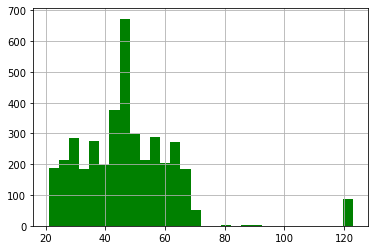

In [43]:
demographic_df['age'].hist(bins = 30, color = 'g')

In [44]:
t_d[t_d['age'] >= 100] #input error?

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,...,name,gender,past_3_years_bike_related_purchases,age,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure
16,17,79,2426,2017-04-03,False,Approved,Norco Bicycles,Standard,medium,medium,...,Yancy Ovett,U,64.0,123.0,Business Systems Development Analyst,IT,Affluent Customer,N,Yes,10.657041
59,60,60,3473,2017-12-18,False,Approved,Giant Bicycles,Standard,high,small,...,Sanderson Alloway,U,34.0,123.0,Analog Circuit Design manager,IT,Mass Customer,N,No,10.657041
63,64,0,2000,2017-07-08,False,Approved,Trek Bicycles,Standard,medium,medium,...,Kain Rene,U,68.0,123.0,Assistant Professor,IT,High Net Worth,N,Yes,10.657041
121,122,24,1038,2017-12-01,True,Approved,Solex,Road,medium,large,...,Fraser Acome,U,57.0,123.0,Engineer I,Manufacturing,Mass Customer,N,Yes,10.657041
173,174,10,3151,2017-12-17,False,Approved,WeareA2B,Touring,medium,medium,...,Thorn Choffin,U,20.0,123.0,Senior Developer,IT,Affluent Customer,N,Yes,10.657041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19583,19584,9,290,2017-05-30,False,Approved,OHM Cycles,Road,medium,medium,...,Giorgio Kevane,U,42.0,123.0,Senior Sales Associate,IT,Mass Customer,N,No,10.657041
19666,19667,78,975,2017-12-20,True,Approved,Giant Bicycles,Standard,medium,large,...,Goldarina Rzehorz,U,26.0,123.0,Automation Specialist IV,IT,Mass Customer,N,No,10.657041
19677,19678,6,1210,2017-07-01,True,Approved,OHM Cycles,Standard,high,medium,...,Shandie Sprigg,U,81.0,123.0,Programmer II,IT,Mass Customer,N,No,10.657041
19831,19832,20,1210,2017-01-11,False,Approved,Trek Bicycles,Standard,medium,small,...,Shandie Sprigg,U,81.0,123.0,Programmer II,IT,Mass Customer,N,No,10.657041


<AxesSubplot:xlabel='age', ylabel='Density'>

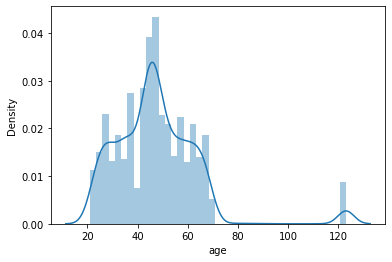

In [45]:
sns.distplot(demographic_df['age'], hist=True, kde=True)

**list_price**

<AxesSubplot:>

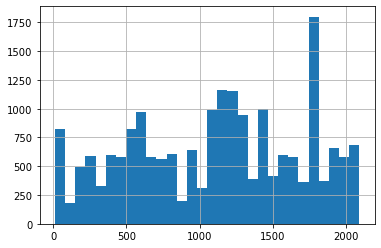

In [46]:
t_d['list_price'].hist(bins=30)

<AxesSubplot:xlabel='list_price', ylabel='Density'>

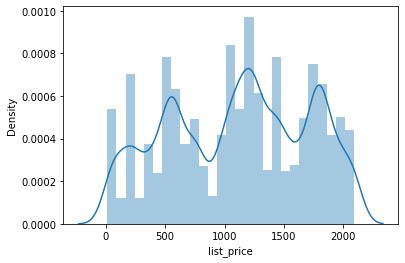

In [47]:
sns.distplot(t_d['list_price'], hist=True, kde=True)

**standard_cost**

<AxesSubplot:>

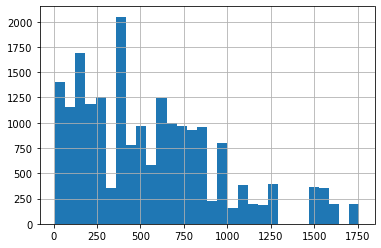

In [48]:
t_d['standard_cost'].hist(bins=30)

<AxesSubplot:xlabel='standard_cost', ylabel='Density'>

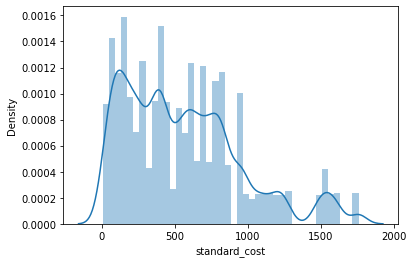

In [49]:
sns.distplot(t_d['standard_cost']) # what is standard_cost?

**past_3_years_bike_related_purchases**

<AxesSubplot:>

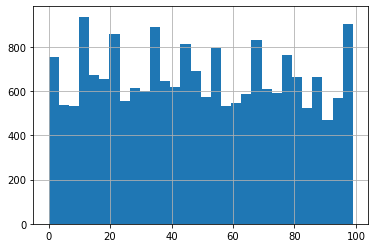

In [50]:
t_d['past_3_years_bike_related_purchases'].hist(bins=30)

<AxesSubplot:xlabel='past_3_years_bike_related_purchases', ylabel='Density'>

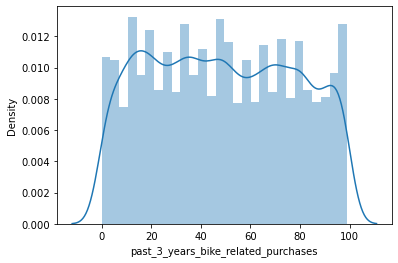

In [51]:
sns.distplot(t_d['past_3_years_bike_related_purchases'])

**Categorical**

<AxesSubplot:xlabel='brand', ylabel='count'>

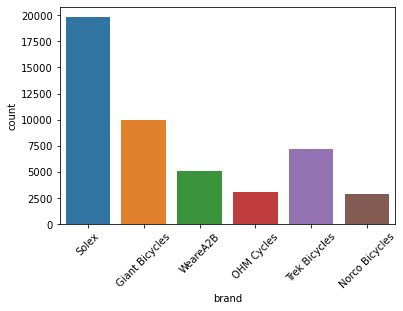

In [52]:
sns.countplot(t_d['order_status']) #mostly accepted, some cancelled
sns.countplot(t_d['product_line']) #standard > road > touring > mountain
sns.countplot(t_d['product_class']) #medium > low > high
sns.countplot(t_d['product_size']) #medium > large > small
sns.countplot(t_d['gender']) #female > male > u
sns.countplot(t_d['job_industry_category']) #financial services > manufacturing > health > retail > property > IT > entertainment > agriculture > telecommunications
plt.xticks(rotation=45)
#scale?
sns.countplot(t_d['wealth_segment']) #mass > affluent > high net worth
sns.countplot(t_d['owns_car']) #yes > no
sns.countplot(x='brand', data=t_d, order = t_d['brand'].value_counts().index)#solex > trek bicycles > giant bicycles > OHM cycles > WeareA2B > Norco Bicycles

<AxesSubplot:>

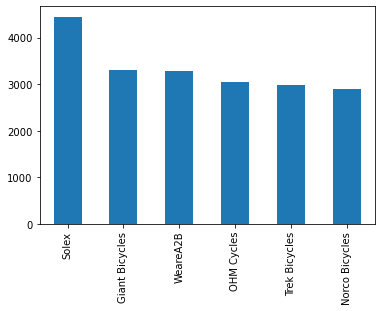

In [67]:
t_d['brand'].value_counts().plot(kind="bar") #为啥不一样？

### *EDA Selection*

**simp**

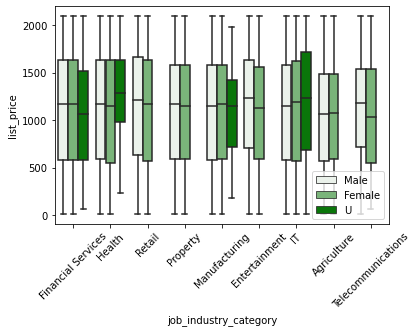

In [137]:
sns.boxplot(x='job_industry_category', y='list_price', hue='gender', data=t_d, order=None,
                    hue_order=None,
                    color="g",
                    saturation=.85, width=.8, notch=False, ax=None)
plt.xticks(rotation=45)
plt.legend(loc='lower right')

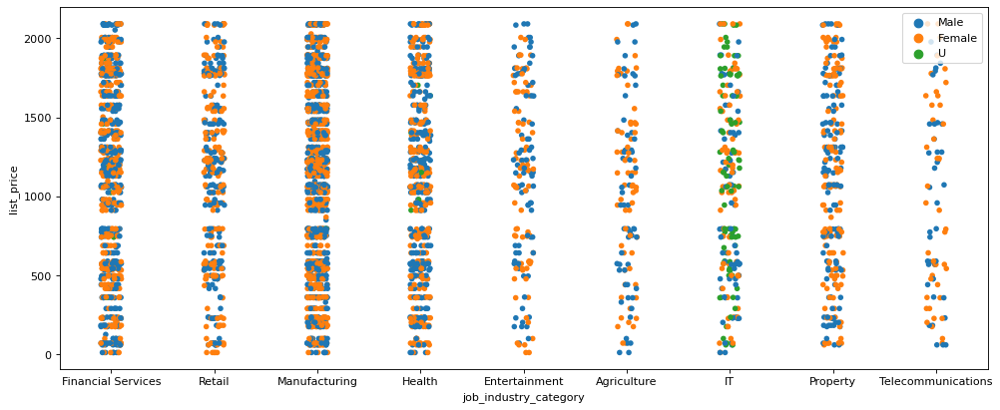

In [138]:
from matplotlib.pyplot import figure

figure(figsize=(15, 6), dpi=80)

sns.stripplot(x='job_industry_category', y='list_price', hue='gender', data=t_d[t_d['CohortIndex'] == 1],
                      color=None, palette=None, size=5,
                      edgecolor="gray", linewidth=0,
                      ax=None, jitter=True)
plt.legend(loc='best')

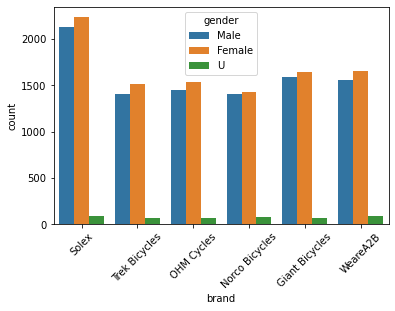

In [139]:
sns.countplot(x='brand', hue='gender', data=t_d)
plt.xticks(rotation=45)
plt.show()

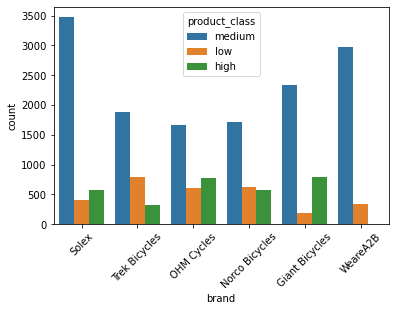

In [140]:
sns.countplot(x='brand', hue='product_class', data=t_d)
plt.xticks(rotation=45)
plt.show()

<AxesSubplot:xlabel='owns_car', ylabel='count'>

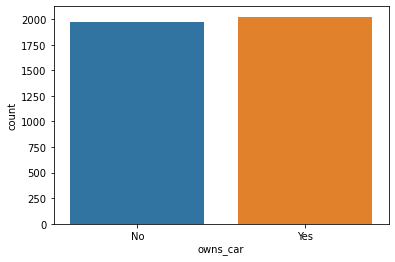

In [141]:
sns.countplot(x='owns_car', data=demographic_df)

In [142]:
alt.Chart(t_d[t_d['CohortIndex'] == 1]).mark_boxplot(extent='min-max').encode(
    x='owns_car',
    y='list_price',
)

alt.Chart(...)

In [143]:
alt.Chart(t_d[t_d['CohortIndex'] == 2]).mark_boxplot(extent='min-max').encode(
    x='owns_car',
    y='list_price',
)

alt.Chart(...)

In [144]:
alt.Chart(t_d[t_d['CohortIndex'] == 1]).mark_bar().encode(
    x='TransactionMonth',
    y=alt.Size('customer_id:Q', aggregate='count'),
    color='gender',
    column='wealth_segment:N'
)

alt.Chart(...)

In [145]:
alt.Chart(demographic_df).mark_bar().encode(
    x=alt.X('job_industry_category', axis=alt.Axis(labelAngle=-30)),
    y=alt.Size('job_industry_category:Q', aggregate='count'),
    color='wealth_segment').properties(
    width=400)

alt.Chart(...)

<AxesSubplot:xlabel='product_line', ylabel='count'>

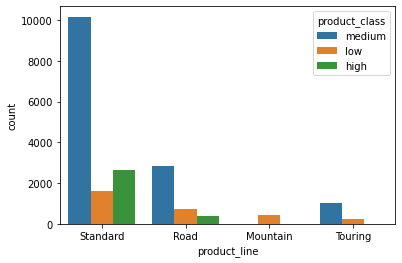

In [146]:
sns.countplot(x='product_line', hue='product_class', data=t_d)

<AxesSubplot:xlabel='age_seg', ylabel='count'>

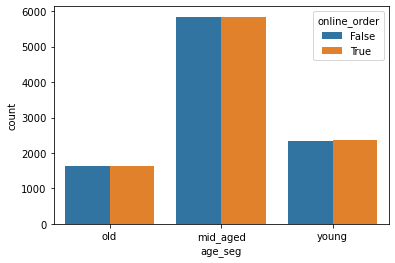

In [147]:
sns.countplot(x='age_seg', hue='online_order', data=t_d[t_d['online_order'].isin([False, True])])

<AxesSubplot:xlabel='age', ylabel='list_price'>

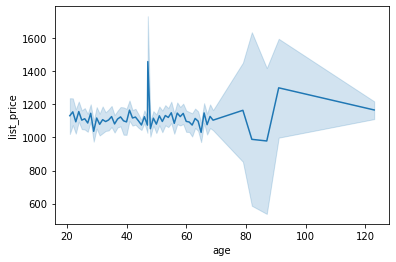

In [148]:
sns.lineplot(x='age', y='list_price', data=t_d)

In [149]:
t_d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19997 entries, 0 to 19999
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   transaction_id                       19997 non-null  int64         
 1   product_id                           19997 non-null  int64         
 2   customer_id                          19997 non-null  int64         
 3   transaction_date                     19997 non-null  datetime64[ns]
 4   online_order                         19997 non-null  object        
 5   order_status                         19997 non-null  object        
 6   brand                                19997 non-null  object        
 7   product_line                         19997 non-null  object        
 8   product_class                        19997 non-null  object        
 9   product_size                         19997 non-null  object        
 10  list_price

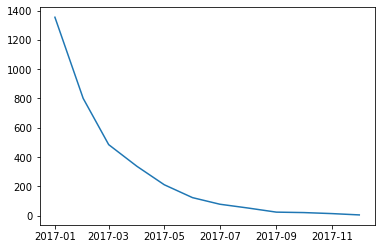

In [150]:
cohort_counts = cohort_data.pivot(index='CohortMonth',  columns ='CohortIndex', values = 'customer_id')
cohort_sizes = cohort_counts.iloc[:,0]

plt.plot(cohort_sizes)

In [151]:
Cohort_count = cohort_sizes.to_frame()
Cohort_count = Cohort_count.reset_index().rename(columns={'CohortMonth': 'CohortMonth'})
Cohort_count = Cohort_count.rename(columns={1: 'Count'})
Cohort_count

,CohortMonth,Count
0,2017-01-01,1354.0
1,2017-02-01,800.0
2,2017-03-01,484.0
3,2017-04-01,336.0
4,2017-05-01,210.0
5,2017-06-01,122.0
6,2017-07-01,77.0
7,2017-08-01,51.0
8,2017-09-01,23.0
9,2017-10-01,20.0


In [152]:
import altair as alt

alt.Chart(Cohort_count).mark_area(
    color="lightblue",
    interpolate='step-after',
    line=True
).encode(
    x='CohortMonth',
    y='Count'
)

alt.Chart(...)

In [153]:
t_d.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'online_order', 'order_status', 'brand', 'product_line',
       'product_class', 'product_size', 'list_price', 'standard_cost',
       'product_first_sold_date', 'TransactionMonth', 'CohortMonth',
       'CohortIndex', 'name', 'gender', 'past_3_years_bike_related_purchases',
       'age', 'job_title', 'job_industry_category', 'wealth_segment',
       'deceased_indicator', 'owns_car', 'tenure', 'age_seg', 'purchase_exp'],
      dtype='object')

In [154]:
testt = t_d[['customer_id', 'brand', 'product_line', 'product_class', 'product_size', 'TransactionMonth', 'CohortMonth', 'CohortIndex', 'gender', 'past_3_years_bike_related_purchases', 'age', 'job_industry_category', 'wealth_segment', 'owns_car']]

In [155]:
testt.head()

,customer_id,brand,product_line,product_class,product_size,TransactionMonth,CohortMonth,CohortIndex,gender,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car
0,2950,Solex,Standard,medium,medium,2017-02-01,2017-02-01,1,Male,19.0,68.0,Financial Services,Mass Customer,Yes
1,3120,Trek Bicycles,Standard,medium,large,2017-05-01,2017-01-01,5,Female,89.0,44.0,Health,Mass Customer,Yes
2,402,OHM Cycles,Standard,low,medium,2017-10-01,2017-01-01,10,Male,9.0,46.0,Retail,Affluent Customer,No
3,3135,Norco Bicycles,Standard,medium,medium,2017-08-01,2017-02-01,7,Male,83.0,61.0,Financial Services,Mass Customer,No
4,787,Giant Bicycles,Standard,medium,large,2017-10-01,2017-01-01,10,Female,29.0,26.0,Retail,Affluent Customer,Yes


In [156]:
testt1 = testt[testt['CohortMonth'] == '2017-02-01']

alt.Chart(testt1).mark_bar(
    cornerRadiusTopLeft=3,
    cornerRadiusTopRight=3
).encode(
    x='month(TransactionMonth):O',
    y='count():Q',
    color='wealth_segment:N'
)

alt.Chart(...)

In [157]:
alt.Chart(testt1).mark_bar().encode(
    x=alt.X('count():Q').stack("normalize"),
    y='month(TransactionMonth):O',
    color='wealth_segment:N'
)

alt.Chart(...)

In [158]:
alt.Chart(testt1).mark_bar().encode(
    x=alt.X('count():Q').stack("normalize"),
    y='month(TransactionMonth):O',
    color='job_industry_category:N'
)

alt.Chart(...)

In [159]:
alt.Chart(testt1).mark_bar().encode(
    column='month(CohortMonth):O',
    x='count(customer_id):Q',
    y='job_industry_category',
    color='wealth_segment:N'
).properties(width=220)

alt.Chart(...)

In [160]:
root1 = t_d[t_d['gender'] == 'Female'].groupby(['CohortMonth', 'CohortIndex']).nunique()['customer_id'].reset_index()
root1 = root1.pivot(index='CohortMonth',  columns ='CohortIndex', values = 'customer_id')
root1_sizes1 = root1.iloc[:,0]
female_retention = root1.divide(root1_sizes1, axis=0).round(3)*100
female_retention

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12
CohortMonth,,,,,,,,,,,,
2017-01-01,100.0,36.1,38.2,36.7,37.4,37.1,36.8,39.5,37.4,37.9,35.5,38.0
2017-02-01,100.0,39.7,35.9,37.4,36.4,37.4,40.2,36.2,41.5,37.2,36.2,NaN
2017-03-01,100.0,30.1,36.3,36.7,33.6,34.0,33.2,45.2,41.7,38.6,NaN,NaN
2017-04-01,100.0,33.1,38.0,45.4,43.6,35.6,42.3,34.4,37.4,NaN,NaN,NaN
2017-05-01,100.0,39.7,37.9,42.2,32.8,40.5,34.5,40.5,NaN,NaN,NaN,NaN
2017-06-01,100.0,29.8,33.3,31.6,36.8,38.6,47.4,NaN,NaN,NaN,NaN,NaN
2017-07-01,100.0,28.9,47.4,39.5,47.4,34.2,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-01,100.0,33.3,48.5,24.2,33.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,100.0,20.0,30.0,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [161]:
root1 = t_d[t_d['gender'] == 'Male'].groupby(['CohortMonth', 'CohortIndex']).nunique()['customer_id'].reset_index()
root1 = root1.pivot(index='CohortMonth',  columns ='CohortIndex', values = 'customer_id')
root1_sizes2 = root1.iloc[:,0]
male_retention = root1.divide(root1_sizes2, axis=0).round(3)*100
male_retention

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12
CohortMonth,,,,,,,,,,,,
2017-01-01,100.0,36.6,36.9,38.7,37.2,34.6,39.5,38.4,36.0,40.4,38.4,37.5
2017-02-01,100.0,41.7,38.3,40.7,34.2,36.8,36.3,33.7,41.2,39.9,37.6,NaN
2017-03-01,100.0,39.4,35.3,31.7,41.7,42.7,39.0,42.7,35.8,35.8,NaN,NaN
2017-04-01,100.0,34.0,34.6,45.7,42.0,37.0,42.6,41.4,39.5,NaN,NaN,NaN
2017-05-01,100.0,41.8,39.6,39.6,35.2,27.5,36.3,35.2,NaN,NaN,NaN,NaN
2017-06-01,100.0,41.0,37.7,44.3,37.7,39.3,39.3,NaN,NaN,NaN,NaN,NaN
2017-07-01,100.0,38.9,30.6,47.2,47.2,25.0,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-01,100.0,47.1,29.4,52.9,11.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,100.0,38.5,30.8,30.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [162]:
root1_sizes2.to_frame().reset_index().rename(columns={'CohortMonth': 'CohortMonth'}).rename(columns={1: 'Count'})


,CohortMonth,Count
0,2017-01-01,653.0
1,2017-02-01,386.0
2,2017-03-01,218.0
3,2017-04-01,162.0
4,2017-05-01,91.0
5,2017-06-01,61.0
6,2017-07-01,36.0
7,2017-08-01,17.0
8,2017-09-01,13.0
9,2017-10-01,11.0


In [163]:
def cohort_to_df(srs):
    srs = srs.to_frame().reset_index().rename(columns={'CohortMonth': 'CohortMonth'}).rename(columns={1: 'Count'})
    return srs

In [164]:
root1_sizes2 = cohort_to_df(root1_sizes2)

In [165]:
root1_sizes1 = cohort_to_df(root1_sizes1)

In [166]:
root1_df = root1_sizes1.merge(root1_sizes2, how='left', left_on='CohortMonth', right_on='CohortMonth').rename(columns={'Count_x': 'Female', 'Count_y': 'Male'})

In [167]:
root1 = t_d.groupby(['CohortMonth', 'CohortIndex', 'gender']).nunique()['customer_id'].reset_index()

In [168]:
root1

initial_counts = root1[root1['CohortIndex'] == 1]
root1 = pd.merge(root1, initial_counts[['CohortMonth', 'gender', 'customer_id']],
                                on=['CohortMonth', 'gender'], suffixes=('', '_initial'))
root1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 216 entries, 0 to 215
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   CohortMonth          216 non-null    datetime64[ns]
 1   CohortIndex          216 non-null    int64         
 2   gender               216 non-null    object        
 3   customer_id          216 non-null    int64         
 4   customer_id_initial  216 non-null    int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 10.1+ KB


In [169]:
root1['retention'] = (root1['customer_id'] / root1['customer_id_initial']).round(3)*100

<AxesSubplot:xlabel='CohortIndex', ylabel='retention'>

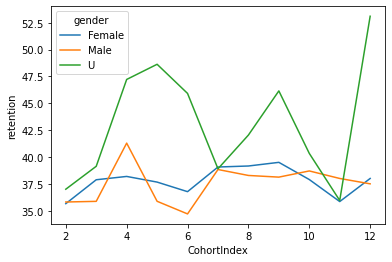

In [170]:
sns.lineplot(data=root1[root1['CohortIndex'] > 1], x='CohortIndex', y='retention', hue='gender', ci=None)

In [171]:
def root_cause_plot(df, cause):
    cause1 = df.groupby(['CohortMonth', 'CohortIndex', f'{cause}']).nunique()['customer_id'].reset_index()
    initial_counts = cause1[cause1['CohortIndex'] == 1]
    cause1 = pd.merge(cause1, initial_counts[['CohortMonth', f'{cause}', 'customer_id']],
                                on=['CohortMonth', f'{cause}'], suffixes=('', '_initial'))
    cause1['retention_rate'] = (cause1['customer_id'] / cause1['customer_id_initial']).round(3)*100
    plot = sns.lineplot(data=cause1[cause1['CohortIndex'] > 1], x='CohortIndex', y='retention_rate', hue=f'{cause}', ci=None)
    return plot

In [172]:
def root_cause_plot_alt(df, cause):
    cause1 = df.groupby(['CohortMonth', 'CohortIndex', f'{cause}']).nunique()['customer_id'].reset_index()
    initial_counts = cause1[cause1['CohortIndex'] == 1]
    cause1 = pd.merge(cause1, initial_counts[['CohortMonth', f'{cause}', 'customer_id']],
                                on=['CohortMonth', f'{cause}'], suffixes=('', '_initial'))
    cause1['retention_rate'] = (cause1['customer_id'] / cause1['customer_id_initial']).round(3)*100
    plot = alt.Chart(cause1[cause1['CohortIndex'] > 1]).mark_line().encode(x='CohortIndex', y=alt.Y('retention_rate:Q', aggregate='mean'), color=f'{cause}')
    return plot

In [173]:
root_cause_plot_alt(t_d, 'owns_car')

alt.Chart(...)

In [174]:
root_cause_plot_alt(t_d, 'wealth_segment')

alt.Chart(...)

In [175]:
root_cause_plot_alt(t_d, 'product_line')

alt.Chart(...)

In [176]:
root_cause_plot_alt(t_d[t_d['online_order'].isin([False, True])], 'online_order')

alt.Chart(...)

In [177]:
root_cause_plot_alt(t_d, 'product_size')

alt.Chart(...)

In [178]:
root_cause_plot_alt(t_d, 'product_size')

alt.Chart(...)

In [179]:
root_cause_plot_alt(t_d[t_d['job_industry_category'].isin(['Financial Services', 'Manufacturing', 'Health'])], 'job_industry_category')

alt.Chart(...)

In [180]:
root_cause_plot_alt(t_d, 'age_seg') #为啥这个趋势是向下？

alt.Chart(...)

In [181]:
root_cause_plot_alt(t_d[t_d['gender'].isin(['Female', 'Male'])], 'gender')

alt.Chart(...)

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

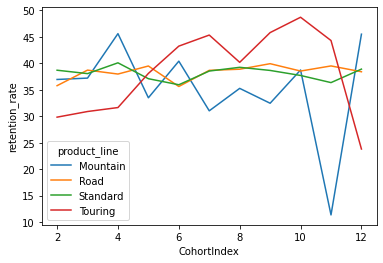

In [182]:
root_cause_plot(t_d, 'product_line')

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

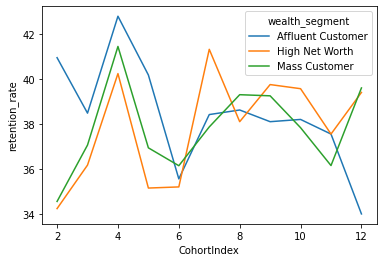

In [183]:
root_cause_plot(t_d, 'wealth_segment')

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

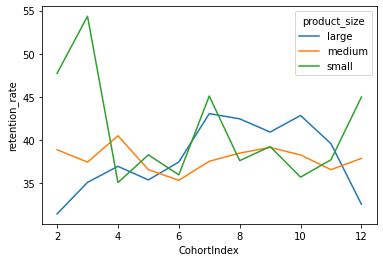

In [184]:
root_cause_plot(t_d, 'product_size')

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

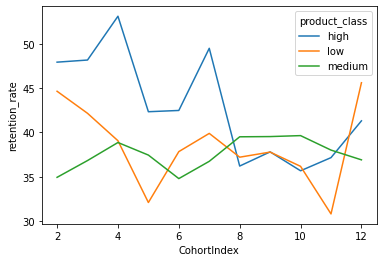

In [185]:
root_cause_plot(t_d, 'product_class')

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

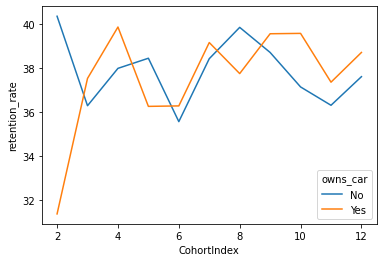

In [186]:
root_cause_plot(t_d, 'owns_car')

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

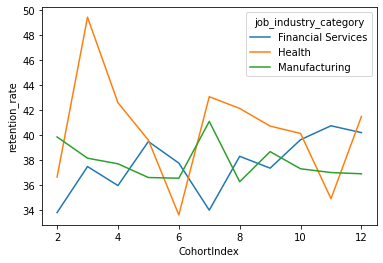

In [187]:
root_cause_plot(t_d[t_d['job_industry_category'].isin(['Financial Services', 'Manufacturing', 'Health'])], 'job_industry_category')

In [188]:
t_d['age_seg'] = pd.cut(t_d['age'], bins=[0, 35, 60, float('inf')], labels=['young', 'mid_aged', 'old'])

In [189]:
t_d['age_seg'] = t_d['age_seg'].astype(str)

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

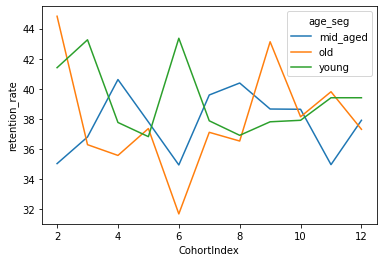

In [190]:
root_cause_plot(t_d, 'age_seg')

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

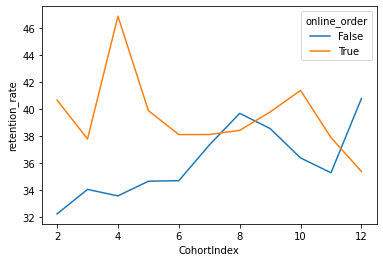

In [191]:
root_cause_plot(t_d[t_d['online_order'].isin([False, True])], 'online_order')

In [192]:
t_d['purchase_exp'] = pd.cut(t_d['past_3_years_bike_related_purchases'], bins=[0, 10, 50, float('inf')], labels=['few', 'mid', 'often']).astype(str)

<AxesSubplot:xlabel='CohortIndex', ylabel='retention_rate'>

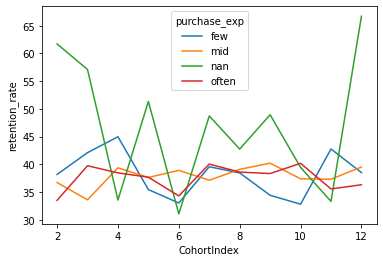

In [193]:
root_cause_plot(t_d, 'purchase_exp')

## Calculate business metrics: Retention rate

**The percentage of active customers compared to the total number of customers after a specific time interval is called retention rate.**

In this section, we will calculate the retention count for each cohort Month paired with cohort Index

Now that we have a count of the retained customers for each cohortMonth and cohortIndex. We will calculate the retention rate for each Cohort.

We will create a pivot table for this purpose.

In [133]:
cohort_data.pivot(index='CohortMonth',  columns ='CohortIndex', values = 'customer_id')

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12
CohortMonth,,,,,,,,,,,,
2017-01-01,1354.0,486.0,508.0,509.0,502.0,483.0,518.0,529.0,500.0,531.0,497.0,516.0
2017-02-01,800.0,325.0,298.0,313.0,288.0,298.0,308.0,281.0,329.0,308.0,296.0,NaN
2017-03-01,484.0,167.0,174.0,167.0,182.0,184.0,172.0,212.0,189.0,181.0,NaN,NaN
2017-04-01,336.0,111.0,121.0,153.0,143.0,121.0,142.0,126.0,132.0,NaN,NaN,NaN
2017-05-01,210.0,85.0,81.0,87.0,71.0,74.0,73.0,81.0,NaN,NaN,NaN,NaN
2017-06-01,122.0,45.0,44.0,47.0,46.0,46.0,53.0,NaN,NaN,NaN,NaN,NaN
2017-07-01,77.0,26.0,29.0,32.0,37.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-01,51.0,19.0,21.0,17.0,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,23.0,7.0,7.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
cohort_counts = cohort_data.pivot(index='CohortMonth',  columns ='CohortIndex', values = 'customer_id')

cohort_sizes = cohort_counts.iloc[:,0]

retention = cohort_counts.divide(cohort_sizes, axis=0)
# Coverting the retention rate into percentage and Rounding off.
retention.round(3)*100

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12
CohortMonth,,,,,,,,,,,,
2017-01-01,100.0,35.9,37.5,37.6,37.1,35.7,38.3,39.1,36.9,39.2,36.7,38.1
2017-02-01,100.0,40.6,37.2,39.1,36.0,37.2,38.5,35.1,41.1,38.5,37.0,NaN
2017-03-01,100.0,34.5,36.0,34.5,37.6,38.0,35.5,43.8,39.0,37.4,NaN,NaN
2017-04-01,100.0,33.0,36.0,45.5,42.6,36.0,42.3,37.5,39.3,NaN,NaN,NaN
2017-05-01,100.0,40.5,38.6,41.4,33.8,35.2,34.8,38.6,NaN,NaN,NaN,NaN
2017-06-01,100.0,36.9,36.1,38.5,37.7,37.7,43.4,NaN,NaN,NaN,NaN,NaN
2017-07-01,100.0,33.8,37.7,41.6,48.1,31.2,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-01,100.0,37.3,41.2,33.3,25.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,100.0,30.4,30.4,39.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Visualizing the retention rate

Before we starting plotting our heatmap, let’s set the index of our Retention rate dataframe to a more readable string format.

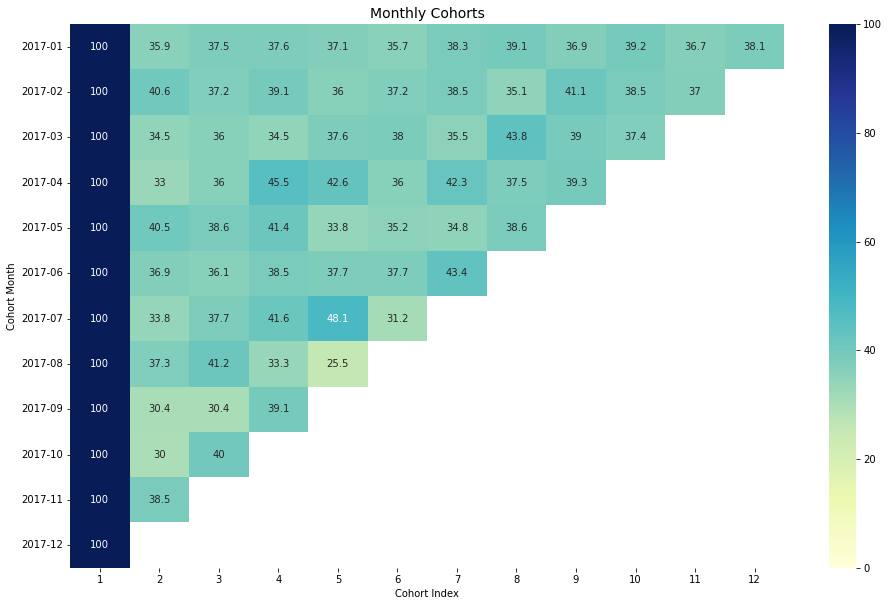

In [135]:
retention = retention.round(3)*100
retention.index = retention.index.strftime('%Y-%m')

# Initialize the figure
plt.figure(figsize=(16, 10))

# Adding a title
plt.title('Monthly Cohorts', fontsize = 14)

# Creating the heatmap
sns.heatmap(retention, annot = True,vmin = 0.0, vmax =100,cmap="YlGnBu", fmt='g')
plt.ylabel('Cohort Month')
plt.xlabel('Cohort Index')
plt.yticks( rotation='360')
plt.show()

## Interpreting the retention rate
The most effective way to visualize and analyze cohort analysis data is through a heatmap, as we did above. It provides both the actual metric values and the color-coding to see the differences in the numbers visually.